In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sunpy
import sunpy.map
import astropy
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord
import dkist
import reproject
from reproject.mosaicking import find_optimal_celestial_wcs, reproject_and_coadd
from reproject import reproject_interp
from ndcube import NDCube

import cmcrameri.cm as cmcm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import (AutoLocator, AutoMinorLocator, 
    FixedLocator, FixedFormatter, LogLocator, StrMethodFormatter)
from astropy.visualization import (AsinhStretch, LinearStretch,
        LogStretch, ImageNormalize, PercentileInterval)

In [2]:
vbi_halpha_mosaic_dir = '../../src/DKIST/vbi_1024/BMRON/'
vbi_halpha_mosaic_dataset = dkist.load_dataset(vbi_halpha_mosaic_dir)

In [3]:
vbi_halpha_mosaic_dataset.shape

(2, 2)

In [4]:
vbi_halpha_mosaic_dataset[0,0].wcs

<WCS(output_frame=CompositeFrame, input_frame=pixel, forward_transform=Model: CompoundModel
Inputs: ('x0', 'x1')
Outputs: ('alpha_C', 'delta_C')
Model set size: 1
Expression: [0] & [1] | [2] | [3] & [4] | [5] | [6]
Components: 
    [0]: <Shift(offset=-2463.76465214 pix)>

    [1]: <Shift(offset=444.35166846 pix)>

    [2]: <AffineTransformation2D(matrix=[[ 0.94768802, -0.00423452], [ 0.00436616,  0.94726487]] pix, translation=[0., 0.] pix)>

    [3]: <Multiply(factor=0.01549815 arcsec / pix)>

    [4]: <Multiply(factor=0.01549815 arcsec / pix)>

    [5]: <Pix2Sky_Gnomonic()>

    [6]: <RotateNative2Celestial(lon=-397.63999753 arcsec, lat=198.42008337 arcsec, lon_pole=180. deg)>
Parameters:
          offset_0           offset_1      ...       lat_6       lon_pole_6
            pix                pix         ...       arcsec         deg    
    ------------------- ------------------ ... ----------------- ----------
    -2463.7646521350985 444.35166846017313 ... 198.4200833683935      180

/home/yjzhu/anaconda3/envs/sunpy/lib/python3.12/site-packages/dask/array/core.py:1712: FutureWarning: The `numpy.nanpercentile` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  warnings.warn(


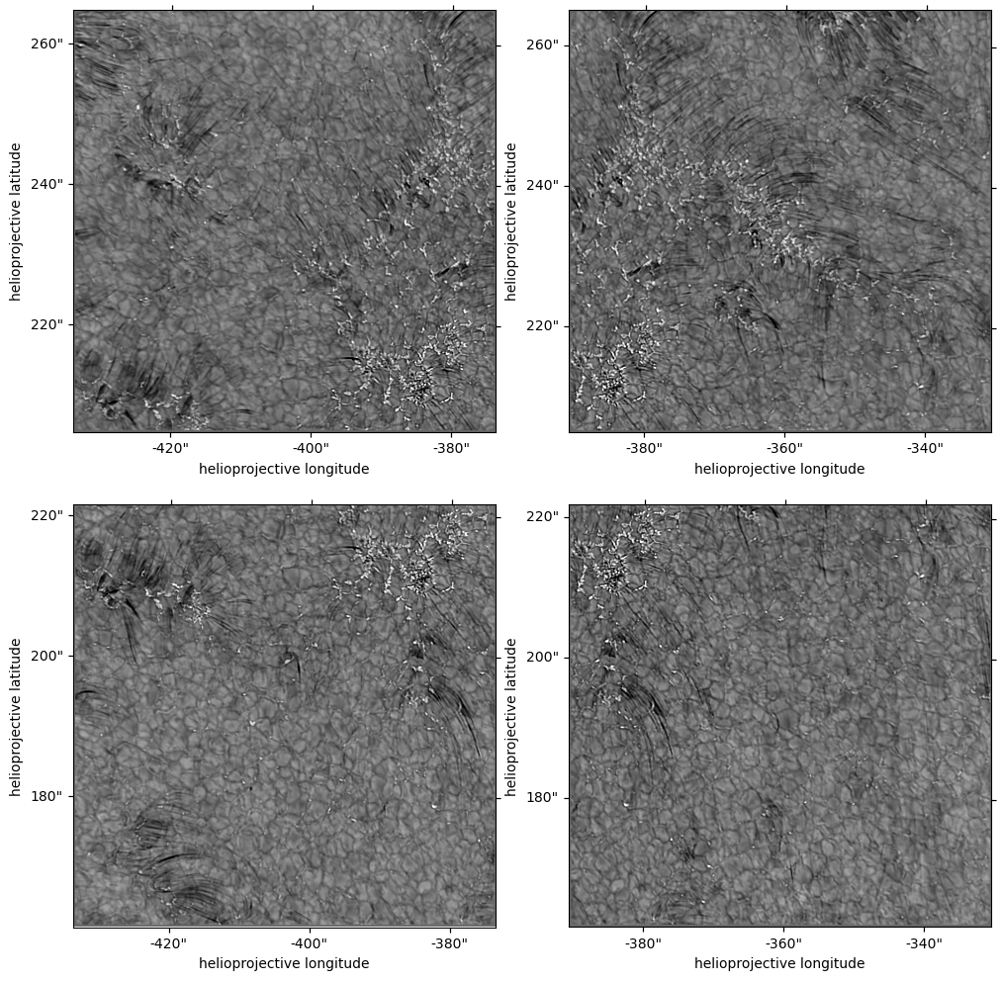

In [5]:
fig = plt.figure(figsize=(10,10),constrained_layout=True)

for ii in range(2):
    for jj in range(2):
        ax = fig.add_subplot(2,2,ii*2+jj+1,projection=vbi_halpha_mosaic_dataset[ii,jj].wcs)
        ax.imshow(vbi_halpha_mosaic_dataset[ii,jj].data,origin='lower',cmap='gray',
                  norm=ImageNormalize(vmin=np.nanpercentile(vbi_halpha_mosaic_dataset[ii,jj].data,0.1),
                                      vmax=np.nanpercentile(vbi_halpha_mosaic_dataset[ii,jj].data,99.9)))

In [6]:
vbi_halpha_mosaic_dataset_tiles = [d[100:-100, 100:-100] for d in vbi_halpha_mosaic_dataset.flat]

In [7]:
reference_wcs_vbi_halpha_mosaic, shape_out_vbi_halpha_mosaic = find_optimal_celestial_wcs(
    [f.wcs for f in vbi_halpha_mosaic_dataset_tiles],
    auto_rotate=True,
    # We drop the output resolution by a factor of 10 to reduce memory
    # remove this line to run at the native resolution of the input data
    resolution=0.05*u.arcsec,
)

print(reference_wcs_vbi_halpha_mosaic.wcs.cdelt[0])

# Due to a bug in reproject we need to reverse the direction of the longitude axis
# https://github.com/astropy/reproject/issues/431

reference_wcs_vbi_halpha_mosaic.wcs.cdelt[0] = np.abs(reference_wcs_vbi_halpha_mosaic.wcs.cdelt[0])



-0.05


In [8]:
vbi_halpha_mosaic_arr, vbi_halpha_mosaic_footprint = reproject_and_coadd(
    vbi_halpha_mosaic_dataset_tiles,
    reference_wcs_vbi_halpha_mosaic,
    reproject_function=reproject_interp,
    shape_out=shape_out_vbi_halpha_mosaic,
    roundtrip_coords=False,
)

In [9]:
vbi_halpha_mosaic_map = sunpy.map.Map(vbi_halpha_mosaic_arr, reference_wcs_vbi_halpha_mosaic)
vbi_halpha_mosaic_map.plot_settings['cmap'] = 'gray'
vbi_halpha_mosaic_map.plot_settings['norm'] = ImageNormalize(vmin=np.nanpercentile(vbi_halpha_mosaic_map.data,0.1),
                                                vmax=np.nanpercentile(vbi_halpha_mosaic_map.data,99.9))

Text(0.5, 1.0, 'VBI H-alpha Mosaic 2022-10-24T18:57:45.334')

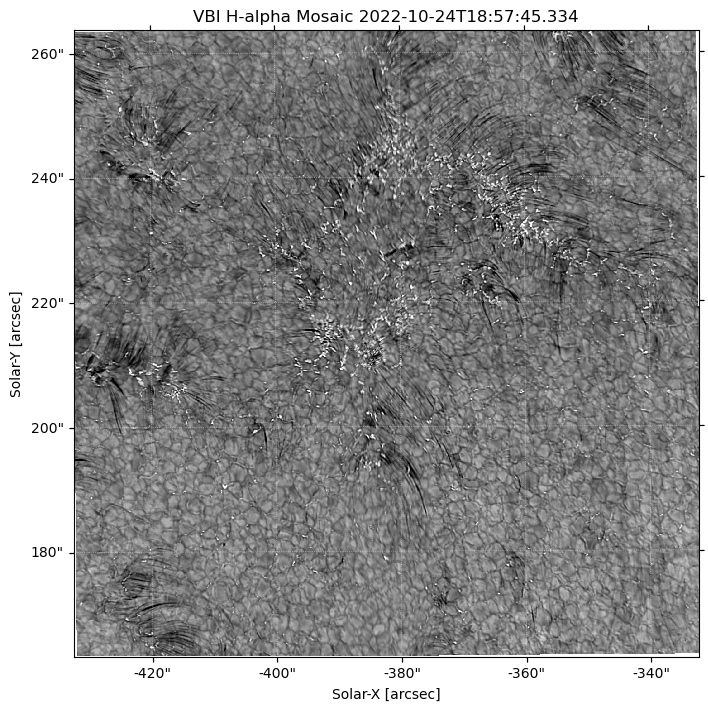

In [10]:
fig = plt.figure(figsize=(7,7),layout='constrained')
ax = fig.add_subplot(projection=vbi_halpha_mosaic_map.wcs)
vbi_halpha_mosaic_map.plot(axes=ax)

ax.set_ylabel('Solar-Y [arcsec]')
ax.set_xlabel('Solar-X [arcsec]')
ax.set_title(f'VBI H-alpha Mosaic {vbi_halpha_mosaic_map.date}')

In [11]:
vbi_hbeta_mosaic_dir = '../../src/DKIST/vbi_1024/BKRZQ/'
vbi_hbeta_mosaic_dataset = dkist.load_dataset(vbi_hbeta_mosaic_dir)

In [12]:
vbi_hbeta_mosaic_dataset.combined_headers['TEXPOSUR']

3.9970000000000008
3.9970000000000008
3.9970000000000008
3.9970000000000008
3.9970000000000008
3.9970000000000008
3.9970000000000008
3.9970000000000008
3.9970000000000008


In [13]:
vbi_hbeta_mosaic_dataset.shape

(3, 3)

In [14]:
vbi_hbeta_mosaic_dataset[0,0].wcs

<WCS(output_frame=CompositeFrame, input_frame=pixel, forward_transform=Model: CompoundModel
Inputs: ('x0', 'x1')
Outputs: ('alpha_C', 'delta_C')
Model set size: 1
Expression: [0] & [1] | [2] | [3] & [4] | [5] | [6]
Components: 
    [0]: <Shift(offset=-5402.89052549 pix)>

    [1]: <Shift(offset=1321.97363248 pix)>

    [2]: <AffineTransformation2D(matrix=[[ 1.0375121 , -0.01300611], [ 0.01287144,  1.05949085]] pix, translation=[0., 0.] pix)>

    [3]: <Multiply(factor=0.01015899 arcsec / pix)>

    [4]: <Multiply(factor=0.01015899 arcsec / pix)>

    [5]: <Pix2Sky_Gnomonic()>

    [6]: <RotateNative2Celestial(lon=-397.64013787 arcsec, lat=198.42015348 arcsec, lon_pole=180. deg)>
Parameters:
         offset_0          offset_1      ...       lat_6       lon_pole_6
           pix               pix         ...       arcsec         deg    
    ----------------- ------------------ ... ----------------- ----------
    -5402.89052549247 1321.9736324800938 ... 198.4201534809611      180.0)>

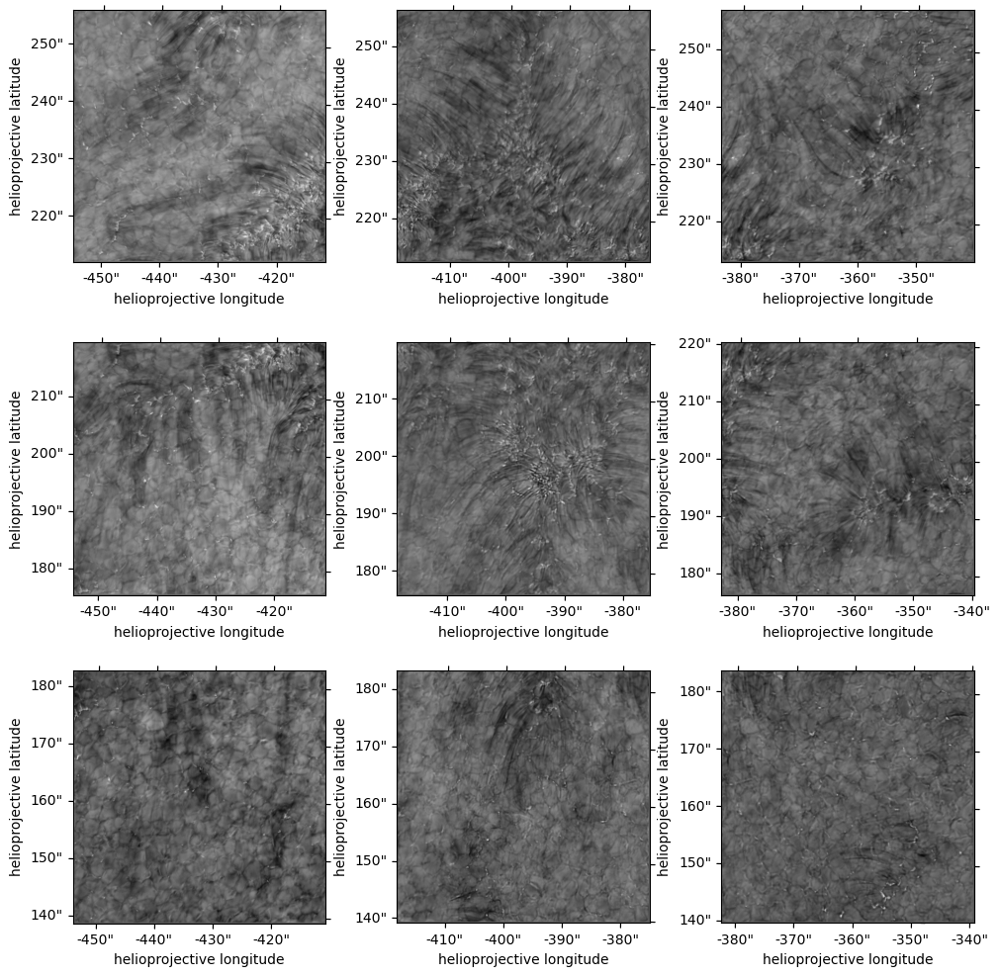

In [15]:
fig = plt.figure(figsize=(10,10),constrained_layout=True)

for ii in range(3):
    for jj in range(3):
        ax = fig.add_subplot(3,3,ii*3+jj+1,projection=vbi_hbeta_mosaic_dataset[ii,jj].wcs)
        ax.imshow(vbi_hbeta_mosaic_dataset[ii,jj].data,origin='lower',cmap='gray')

In [16]:
vbi_hbeta_mosaic_dataset_tiles = [d[100:-100, 100:-100] for d in vbi_hbeta_mosaic_dataset.flat]

reference_wcs_vbi_hbeta_mosaic, shape_out_vbi_hbeta_mosaic = find_optimal_celestial_wcs(
    [f.wcs for f in vbi_hbeta_mosaic_dataset_tiles],
    auto_rotate=True,
    # We drop the output resolution by a factor of 10 to reduce memory
    # remove this line to run at the native resolution of the input data
    resolution=0.03*u.arcsec,
)

# Due to a bug in reproject we need to reverse the direction of the longitude axis

reference_wcs_vbi_hbeta_mosaic.wcs.cdelt[0] = np.abs(reference_wcs_vbi_hbeta_mosaic.wcs.cdelt[0])

In [17]:
vbi_hbeta_mosaic_arr, vbi_hbeta_mosaic_footprint = reproject_and_coadd(
    vbi_hbeta_mosaic_dataset_tiles,
    reference_wcs_vbi_hbeta_mosaic,
    reproject_function=reproject_interp,
    shape_out=shape_out_vbi_hbeta_mosaic,
    combine_function='mean',
)

In [18]:
vbi_hbeta_mosaic_map = sunpy.map.Map(vbi_hbeta_mosaic_arr, reference_wcs_vbi_hbeta_mosaic)
vbi_hbeta_mosaic_map.plot_settings['cmap'] = 'gray'
vbi_hbeta_mosaic_map.plot_settings['norm'] = ImageNormalize(vmin=np.nanpercentile(vbi_hbeta_mosaic_map.data,0.1),
                                                vmax=np.nanpercentile(vbi_hbeta_mosaic_map.data,99.9))

Text(0.5, 1.0, 'VBI H-beta Mosaic 2022-10-24T18:58:52.362')

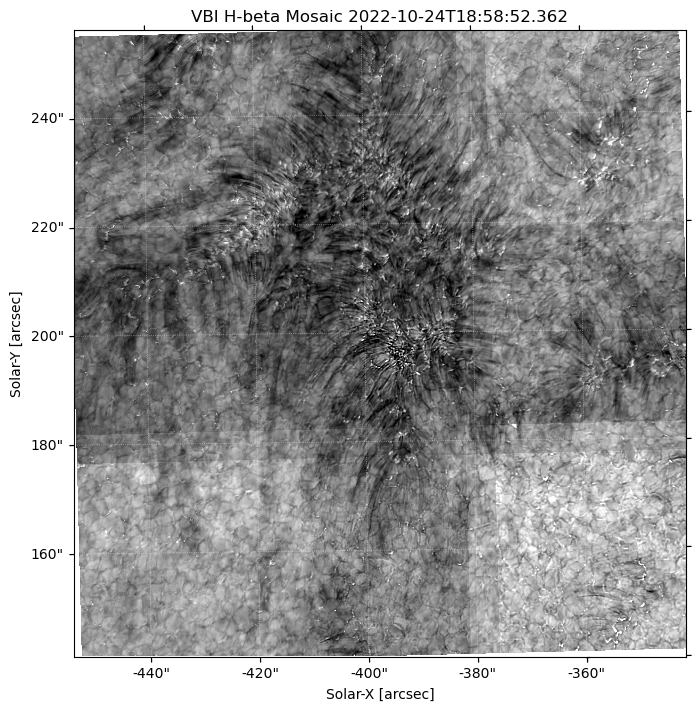

In [19]:
fig = plt.figure(figsize=(7,7),layout='constrained')
ax = fig.add_subplot(projection=vbi_hbeta_mosaic_map)
vbi_hbeta_mosaic_map.plot(axes=ax)

ax.set_ylabel('Solar-Y [arcsec]')
ax.set_xlabel('Solar-X [arcsec]')
ax.set_title(f'VBI H-beta Mosaic {vbi_hbeta_mosaic_map.date}')

In [20]:
vbi_CaIIK_mosaic_dir = '../../src/DKIST/vbi_1024/ADRVN/'
vbi_CaIIK_mosaic_dataset = dkist.load_dataset(vbi_CaIIK_mosaic_dir)

In [21]:
vbi_CaIIK_mosaic_dataset.shape

(3, 3)

In [22]:
vbi_CaIIK_mosaic_dataset[0,0].wcs

<WCS(output_frame=CompositeFrame, input_frame=pixel, forward_transform=Model: CompoundModel
Inputs: ('x0', 'x1')
Outputs: ('alpha_C', 'delta_C')
Model set size: 1
Expression: [0] & [1] | [2] | [3] & [4] | [5] | [6]
Components: 
    [0]: <Shift(offset=-5402.89052557 pix)>

    [1]: <Shift(offset=1321.97363248 pix)>

    [2]: <AffineTransformation2D(matrix=[[ 1.03751896, -0.01300491], [ 0.0128702 ,  1.05949067]] pix, translation=[0., 0.] pix)>

    [3]: <Multiply(factor=0.01015899 arcsec / pix)>

    [4]: <Multiply(factor=0.01015899 arcsec / pix)>

    [5]: <Pix2Sky_Gnomonic()>

    [6]: <RotateNative2Celestial(lon=-397.63797144 arcsec, lat=198.41992246 arcsec, lon_pole=180. deg)>
Parameters:
         offset_0           offset_1      ...      lat_6       lon_pole_6
           pix                pix         ...      arcsec         deg    
    ------------------ ------------------ ... ---------------- ----------
    -5402.890525565277 1321.9736324753735 ... 198.419922459193      180.0)>

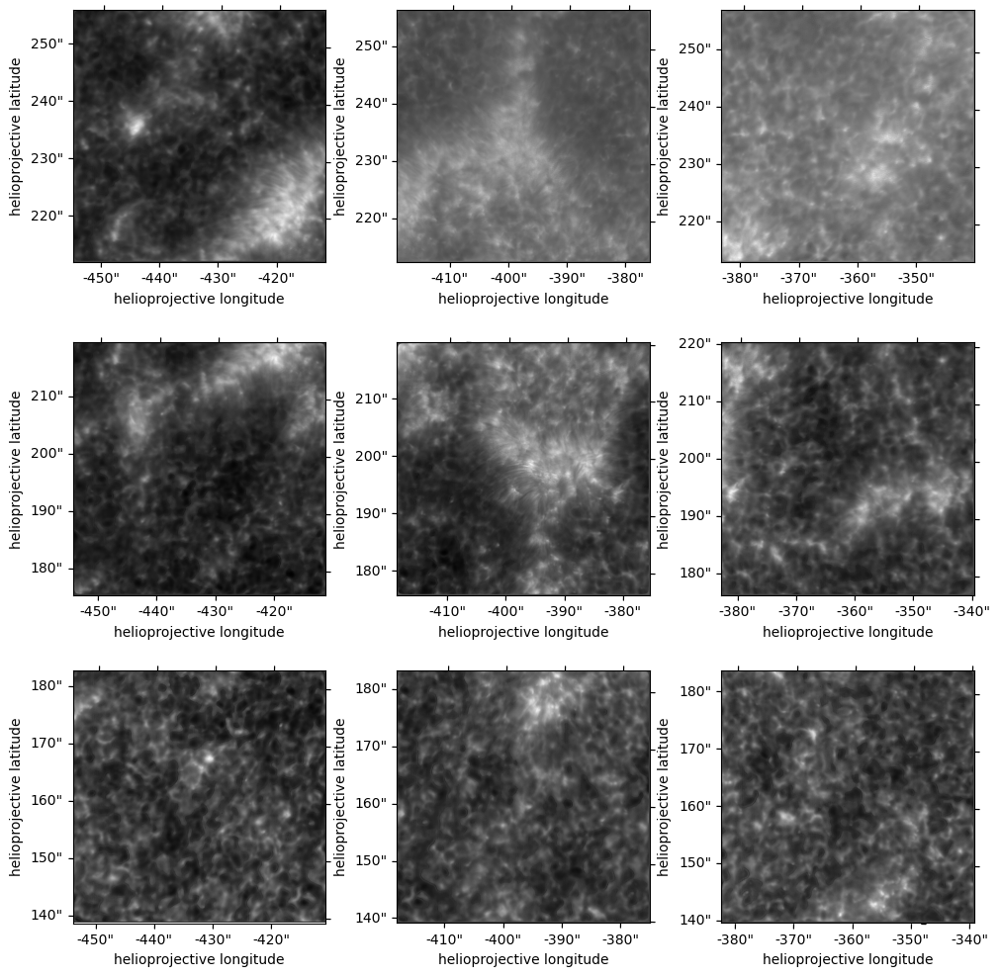

In [23]:
fig = plt.figure(figsize=(10,10),constrained_layout=True)

for ii in range(3):
    for jj in range(3):
        ax = fig.add_subplot(3,3,ii*3+jj+1,projection=vbi_CaIIK_mosaic_dataset[ii,jj].wcs)
        ax.imshow(vbi_CaIIK_mosaic_dataset[ii,jj].data,origin='lower',cmap='gray')

In [24]:
vbi_CaIIK_mosaic_dataset_tiles = [d[100:-100, 100:-100] for d in vbi_CaIIK_mosaic_dataset.flat]

reference_wcs_vbi_CaIIK_mosaic, shape_out_vbi_CaIIK_mosaic = find_optimal_celestial_wcs(
    [f.wcs for f in vbi_CaIIK_mosaic_dataset_tiles],
    auto_rotate=True,
    # We drop the output resolution by a factor of 10 to reduce memory
    # remove this line to run at the native resolution of the input data
    resolution=0.03*u.arcsec,
)

# Due to a bug in reproject we need to reverse the direction of the longitude axis

reference_wcs_vbi_CaIIK_mosaic.wcs.cdelt[0] = np.abs(reference_wcs_vbi_CaIIK_mosaic.wcs.cdelt[0])

In [25]:
vbi_CaIIK_mosaic_arr, vbi_CaIIK_mosaic_footprint = reproject_and_coadd(
    vbi_CaIIK_mosaic_dataset_tiles,
    reference_wcs_vbi_CaIIK_mosaic,
    reproject_function=reproject_interp,
    shape_out=shape_out_vbi_CaIIK_mosaic,
)

In [26]:
vbi_CaIIK_mosaic_map = sunpy.map.Map(vbi_CaIIK_mosaic_arr, reference_wcs_vbi_CaIIK_mosaic)
vbi_CaIIK_mosaic_map.plot_settings['cmap'] = 'gray'
vbi_CaIIK_mosaic_map.plot_settings['norm'] = ImageNormalize(vmin=np.nanpercentile(vbi_CaIIK_mosaic_map.data,0.1),
                                                vmax=np.nanpercentile(vbi_CaIIK_mosaic_map.data,99.9))

Text(0.5, 1.0, 'VBI Ca II K Mosaic 2022-10-24T18:57:57.533')

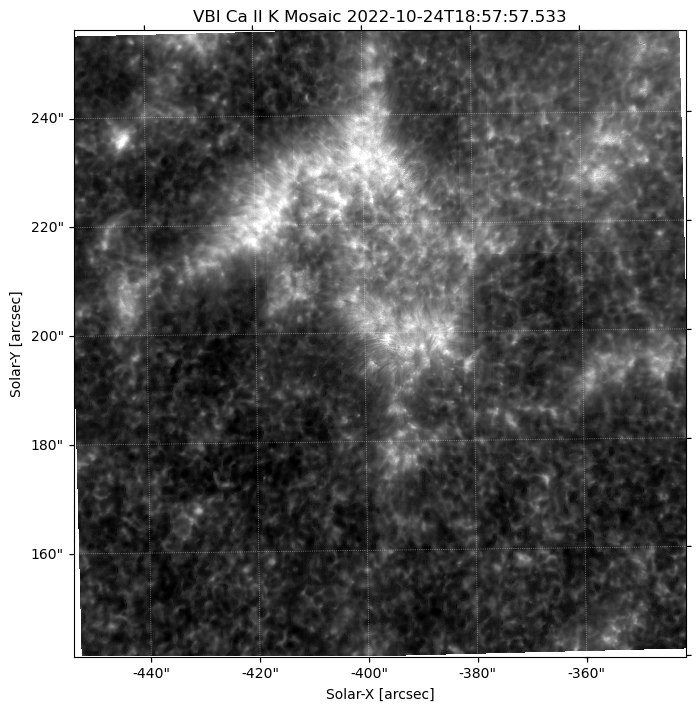

In [27]:
fig = plt.figure(figsize=(7,7),layout='constrained')
ax = fig.add_subplot(projection=vbi_CaIIK_mosaic_map.wcs)

vbi_CaIIK_mosaic_map.plot(axes=ax)

ax.set_ylabel('Solar-Y [arcsec]')
ax.set_xlabel('Solar-X [arcsec]')
ax.set_title(f'VBI Ca II K Mosaic {vbi_CaIIK_mosaic_map.date}')

In [28]:
aia_1600_map_185751 = sunpy.map.Map('../../src/AIA/20221024/1600/lvl15_dkist_mosaic/aia.lev1_uv_24s.2022-10-24T185751Z.1600.image.fits')
aia_1600_map_185751_crop = aia_1600_map_185751.submap(SkyCoord(-450*u.arcsec, 150*u.arcsec, frame=aia_1600_map_185751.coordinate_frame),
                                                       top_right=SkyCoord(-320*u.arcsec, 280*u.arcsec, frame=aia_1600_map_185751.coordinate_frame))

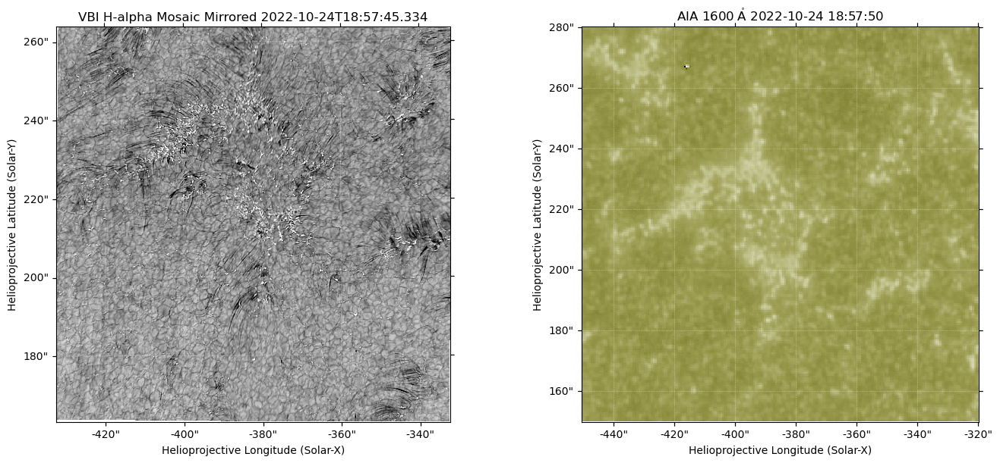

In [64]:
vbi_halpha_mosaic_map_mirror = sunpy.map.Map(np.flip(vbi_halpha_mosaic_map.data,axis=1), vbi_halpha_mosaic_map.meta)
vbi_halpha_mosaic_map_mirror.plot_settings['cmap'] = 'gray'
vbi_halpha_mosaic_map_mirror.plot_settings['norm'] = ImageNormalize(vmin=np.nanpercentile(vbi_halpha_mosaic_map_mirror.data,0.1),
                                                vmax=np.nanpercentile(vbi_halpha_mosaic_map_mirror.data,99.9),
                                                stretch=AsinhStretch(0.5))

fig = plt.figure(figsize=(14,6),layout='constrained')

ax1 = fig.add_subplot(121,projection=vbi_halpha_mosaic_map_mirror)
vbi_halpha_mosaic_map_mirror.plot(axes=ax1)
ax1.set_title(f'VBI H-alpha Mosaic Mirrored {vbi_halpha_mosaic_map_mirror.date}')

ax2 = fig.add_subplot(122,projection=aia_1600_map_185751_crop)
aia_1600_map_185751_crop.plot(axes=ax2)

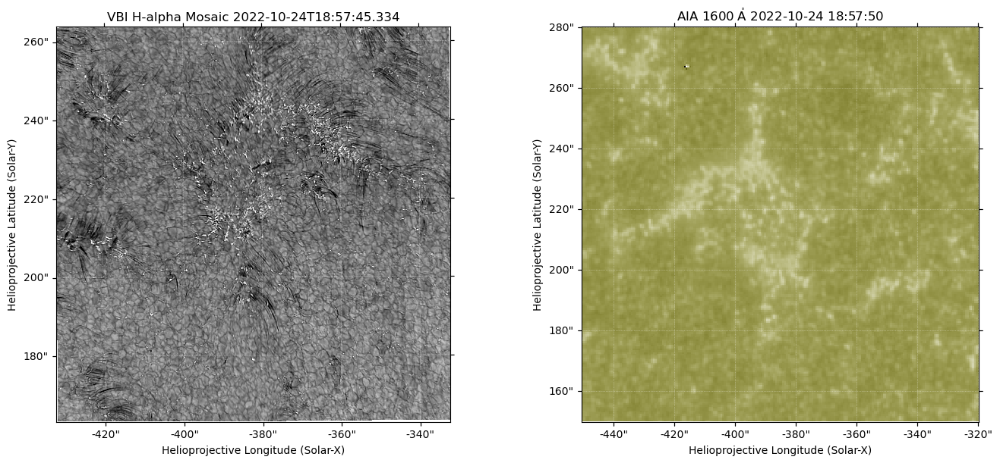

In [30]:
fig = plt.figure(figsize=(14,6),layout='constrained')

ax1 = fig.add_subplot(121,projection=vbi_halpha_mosaic_map)
vbi_halpha_mosaic_map.plot(axes=ax1)
ax1.set_title(f'VBI H-alpha Mosaic {vbi_halpha_mosaic_map.date}')

ax2 = fig.add_subplot(122,projection=aia_1600_map_185751_crop)
aia_1600_map_185751_crop.plot(axes=ax2)

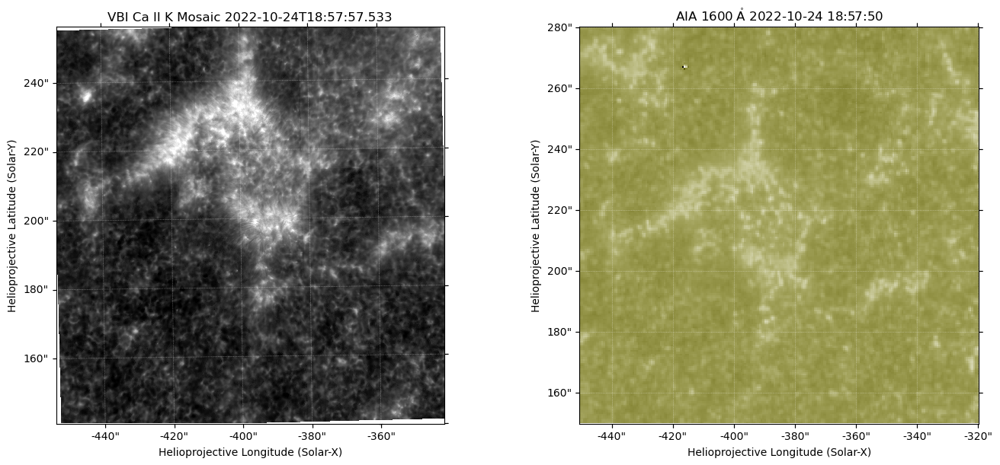

In [31]:
fig = plt.figure(figsize=(14,6),layout='constrained')

ax1 = fig.add_subplot(121,projection=vbi_CaIIK_mosaic_map)
vbi_CaIIK_mosaic_map.plot(axes=ax1)
ax1.set_title(f'VBI Ca II K Mosaic {vbi_CaIIK_mosaic_map.date}')

ax2 = fig.add_subplot(122,projection=aia_1600_map_185751_crop)
aia_1600_map_185751_crop.plot(axes=ax2)

# for ax in (ax1,ax2):
#     bounds = ax.axis()
#     aia_1600_map_185751_crop.draw_contours(levels=[120]*aia_1600_map_185751_crop.unit,colors=["r"],axes=ax,alpha=0.8)
#     ax.axis(bounds)

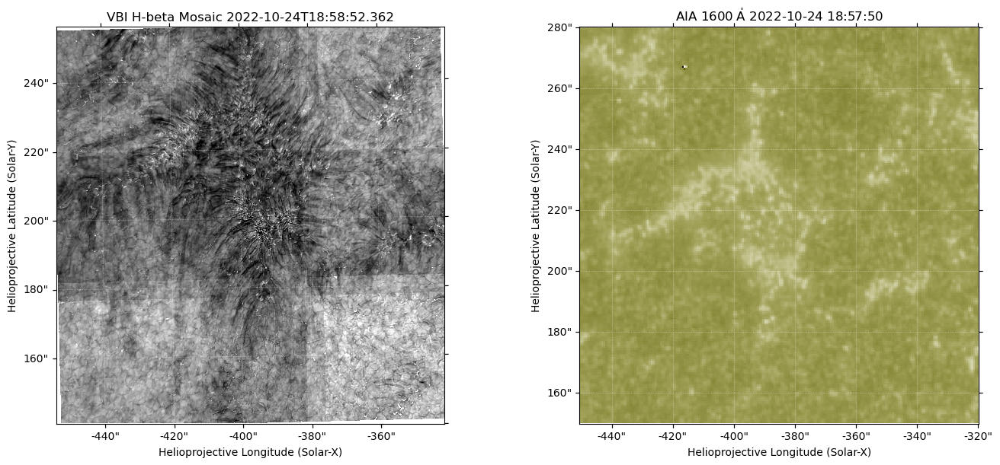

In [32]:
fig = plt.figure(figsize=(14,6),layout='constrained')

ax1 = fig.add_subplot(121,projection=vbi_hbeta_mosaic_map)
vbi_hbeta_mosaic_map.plot(axes=ax1)
ax1.set_title(f'VBI H-beta Mosaic {vbi_hbeta_mosaic_map.date}')

ax2 = fig.add_subplot(122,projection=aia_1600_map_185751_crop)
aia_1600_map_185751_crop.plot(axes=ax2)

# for ax in (ax1,ax2):
#     bounds = ax.axis()
#     aia_1600_map_185751_crop.draw_contours(levels=[120]*aia_1600_map_185751_crop.unit,colors=["r"],axes=ax,alpha=0.6)
#     ax.axis(bounds)

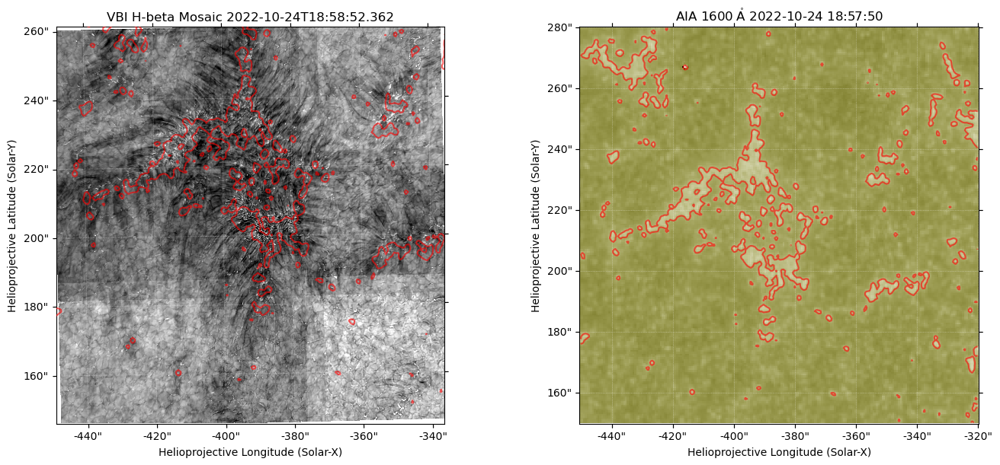

In [33]:
vbi_hbeta_xshift, vbi_hbeta_yshift = 5*u.arcsec, 5*u.arcsec
fig = plt.figure(figsize=(14,6),layout='constrained')

vbi_hbeta_mosaic_map_shifted = vbi_hbeta_mosaic_map.shift_reference_coord(vbi_hbeta_xshift, vbi_hbeta_yshift)

ax1 = fig.add_subplot(121,projection=vbi_hbeta_mosaic_map_shifted)
vbi_hbeta_mosaic_map_shifted.plot(axes=ax1)
ax1.set_title(f'VBI H-beta Mosaic {vbi_hbeta_mosaic_map_shifted.date}')

ax2 = fig.add_subplot(122,projection=aia_1600_map_185751_crop)
aia_1600_map_185751_crop.plot(axes=ax2)

for ax in (ax1,ax2):
    bounds = ax.axis()
    aia_1600_map_185751_crop.draw_contours(levels=[120]*aia_1600_map_185751_crop.unit,colors=["r"],axes=ax,alpha=0.6)
    ax.axis(bounds)

In [34]:
vbi_tio_mosaic_dir = '../../src/DKIST/vbi_1024/BOYQK/'
vbi_tio_mosaic_dataset = dkist.load_dataset(vbi_tio_mosaic_dir)

In [35]:
vbi_tio_mosaic_dataset.shape

(2, 2)

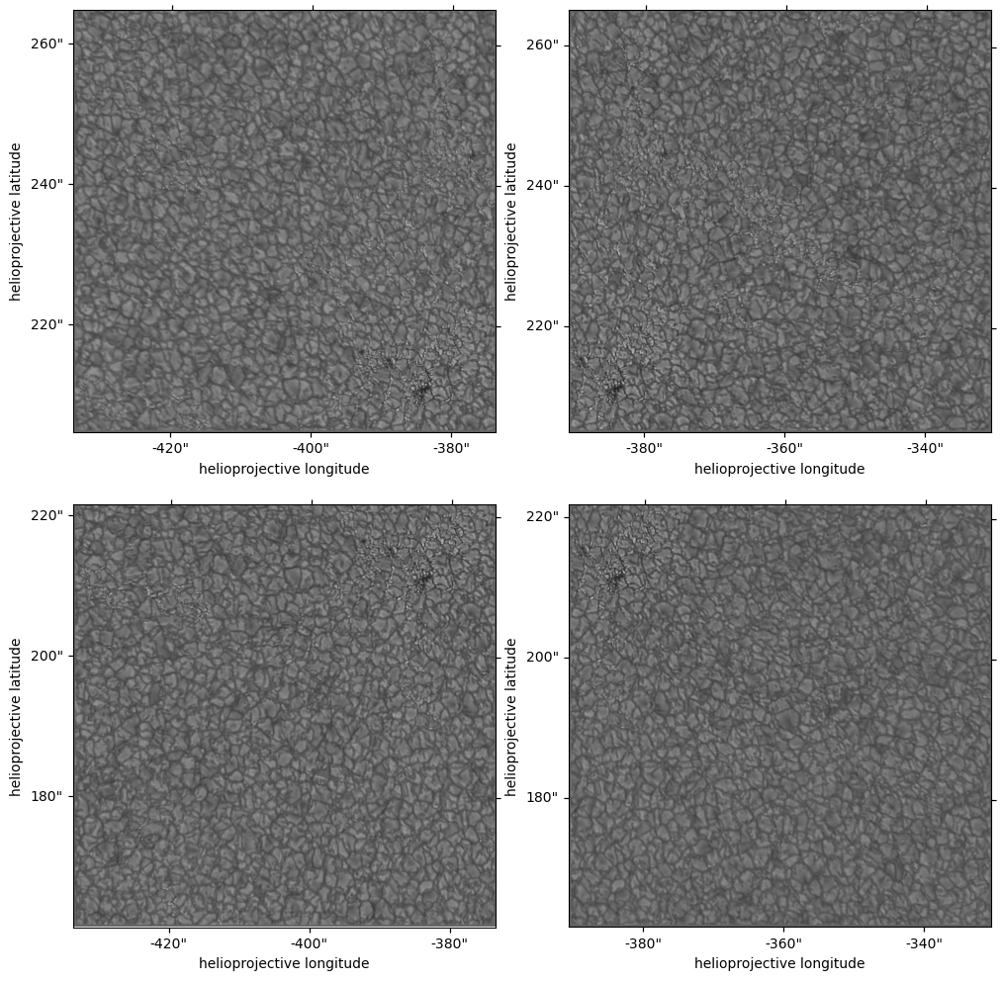

In [36]:
fig = plt.figure(figsize=(10,10),constrained_layout=True)

for ii in range(2):
    for jj in range(2):
        ax = fig.add_subplot(2,2,ii*2+jj+1,projection=vbi_tio_mosaic_dataset[ii,jj].wcs)
        ax.imshow(vbi_tio_mosaic_dataset[ii,jj].data,origin='lower',cmap='gray')

In [37]:
vbi_tio_mosaic_dataset_tiles = [d[100:-100, 100:-100] for d in vbi_tio_mosaic_dataset.flat]

In [38]:
reference_wcs_vbi_tio_mosaic, shape_out_vbi_tio_mosaic = find_optimal_celestial_wcs(
    [f.wcs for f in vbi_tio_mosaic_dataset_tiles],
    auto_rotate=True,
    # We drop the output resolution by a factor of 10 to reduce memory
    # remove this line to run at the native resolution of the input data
    resolution=0.05*u.arcsec,
)

# Due to a bug in reproject we need to reverse the direction of the longitude axis

reference_wcs_vbi_tio_mosaic.wcs.cdelt[0] = np.abs(reference_wcs_vbi_tio_mosaic.wcs.cdelt[0])

In [39]:
vbi_tio_mosaic_arr, vbi_tio_mosaic_footprint = reproject_and_coadd(
    vbi_tio_mosaic_dataset_tiles,
    reference_wcs_vbi_tio_mosaic,
    reproject_function=reproject_interp,
    shape_out=shape_out_vbi_tio_mosaic,
)

In [40]:
vbi_tio_mosaic_map = sunpy.map.Map(vbi_tio_mosaic_arr, reference_wcs_vbi_tio_mosaic)
vbi_tio_mosaic_map.plot_settings['cmap'] = 'gray'
vbi_tio_mosaic_map.plot_settings['norm'] = ImageNormalize(vmin=np.nanpercentile(vbi_tio_mosaic_map.data,0.1),
                                                vmax=np.nanpercentile(vbi_tio_mosaic_map.data,99.9))

Text(0.5, 1.0, 'VBI TiO Mosaic 2022-10-24T18:57:57.520')

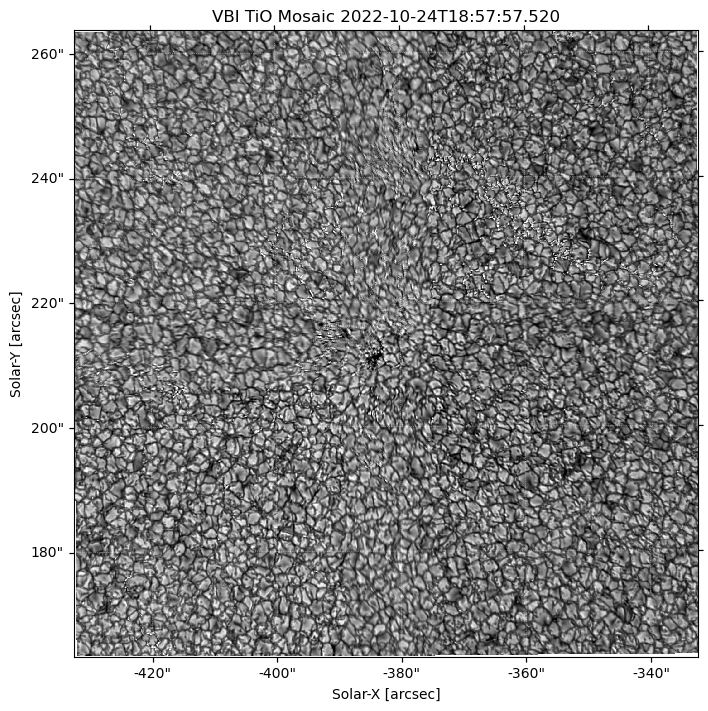

In [41]:
fig = plt.figure(figsize=(7,7),layout='constrained')
ax = fig.add_subplot(projection=vbi_tio_mosaic_map.wcs)
vbi_tio_mosaic_map.plot(axes=ax)

ax.set_ylabel('Solar-Y [arcsec]')
ax.set_xlabel('Solar-X [arcsec]')
ax.set_title(f'VBI TiO Mosaic {vbi_tio_mosaic_map.date}')


In [42]:
vbi_gband_mosaic_dir = '../../src/DKIST/vbi_1024/BGPGJ/'
vbi_gband_mosaic_dataset = dkist.load_dataset(vbi_gband_mosaic_dir)

In [43]:
vbi_gband_mosaic_dataset.shape

(3, 3)

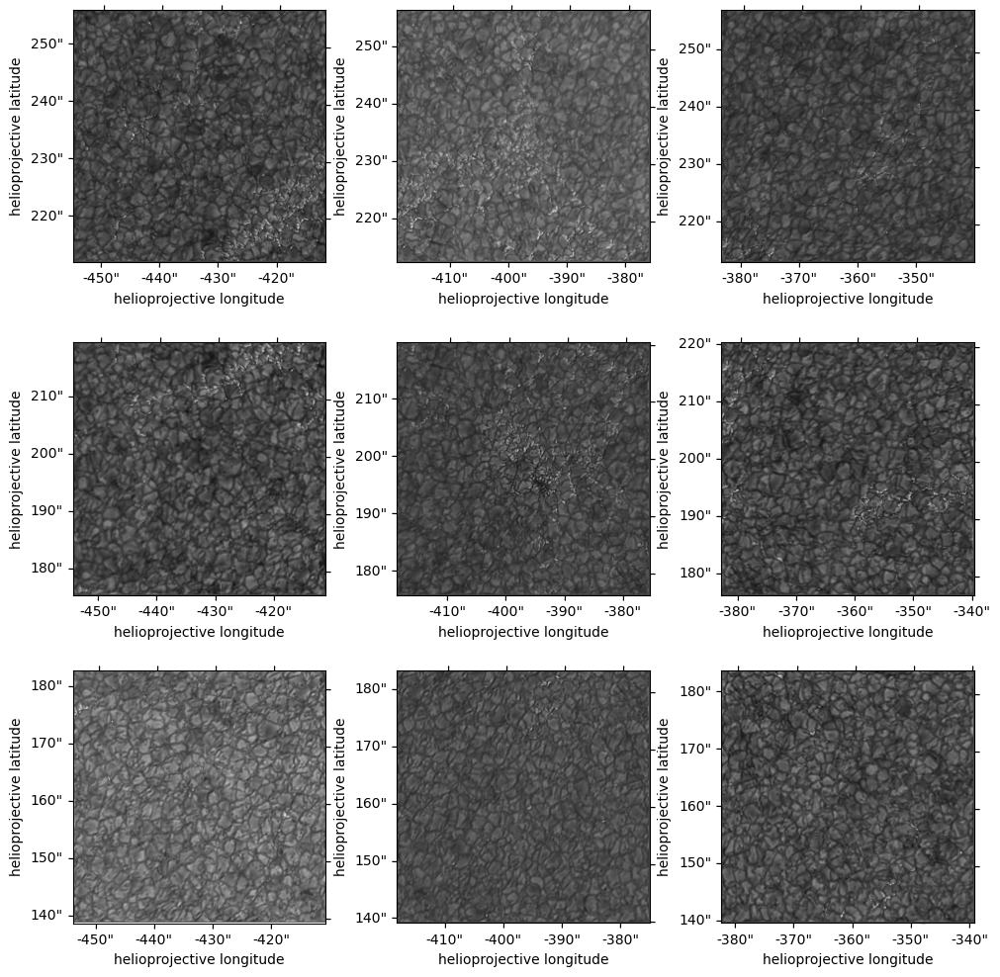

In [44]:
fig = plt.figure(figsize=(10,10),constrained_layout=True)

for ii in range(3):
    for jj in range(3):
        ax = fig.add_subplot(3,3,ii*3+jj+1,projection=vbi_gband_mosaic_dataset[ii,jj].wcs)
        ax.imshow(vbi_gband_mosaic_dataset[ii,jj].data,origin='lower',cmap='gray')

In [45]:
vbi_gband_mosaic_dataset_tiles = [d[100:-100, 100:-100] for d in vbi_gband_mosaic_dataset.flat]

In [50]:
reference_wcs_vbi_gband_mosaic, shape_out_vbi_gband_mosaic = find_optimal_celestial_wcs(
    [f.wcs for f in vbi_gband_mosaic_dataset_tiles],
    auto_rotate=True,
    # We drop the output resolution by a factor of 10 to reduce memory
    # remove this line to run at the native resolution of the input data
    resolution=0.03*u.arcsec,
)

# Due to a bug in reproject we need to reverse the direction of the longitude axis

reference_wcs_vbi_gband_mosaic.wcs.cdelt[0] = np.abs(reference_wcs_vbi_gband_mosaic.wcs.cdelt[0])

In [51]:
vbi_gband_mosaic_arr, vbi_gband_mosaic_footprint = reproject_and_coadd(
    vbi_gband_mosaic_dataset_tiles,
    reference_wcs_vbi_gband_mosaic,
    reproject_function=reproject_interp,
    shape_out=shape_out_vbi_gband_mosaic,
)

In [52]:
vbi_gband_mosaic_map = sunpy.map.Map(vbi_gband_mosaic_arr, reference_wcs_vbi_gband_mosaic)
vbi_gband_mosaic_map.plot_settings['cmap'] = 'gray'
vbi_gband_mosaic_map.plot_settings['norm'] = ImageNormalize(vmin=np.nanpercentile(vbi_gband_mosaic_map.data,0.1),
                                                vmax=np.nanpercentile(vbi_gband_mosaic_map.data,99.9))

Text(0.5, 1.0, 'VBI G-band Mosaic 2022-10-24T18:58:24.940')

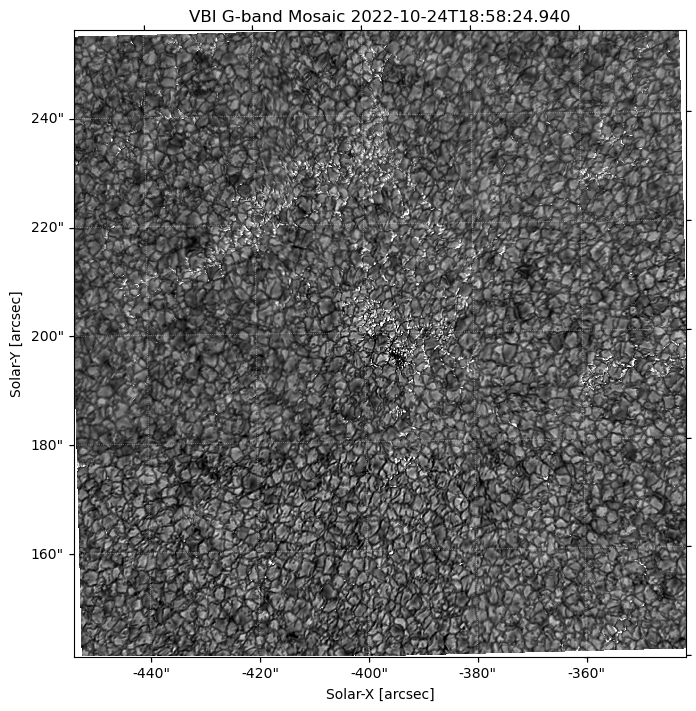

In [53]:
fig = plt.figure(figsize=(7,7),layout='constrained')
ax = fig.add_subplot(projection=vbi_gband_mosaic_map.wcs)

vbi_gband_mosaic_map.plot(axes=ax)

ax.set_ylabel('Solar-Y [arcsec]')
ax.set_xlabel('Solar-X [arcsec]')
ax.set_title(f'VBI G-band Mosaic {vbi_gband_mosaic_map.date}')

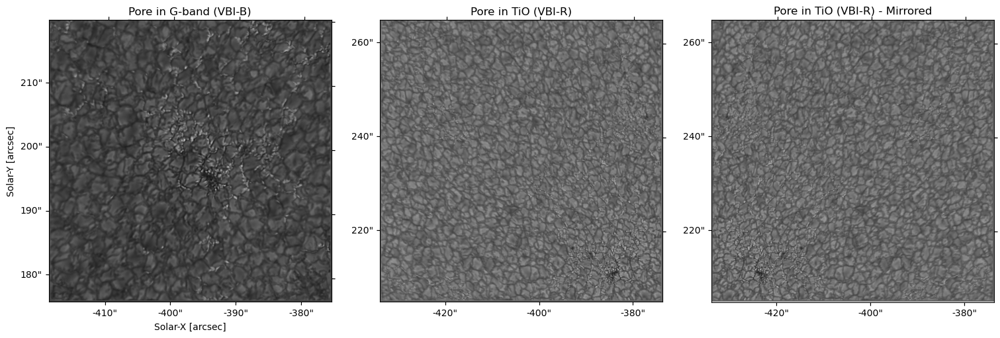

In [63]:
fig = plt.figure(figsize=(15,5),layout='constrained')

ax1 = fig.add_subplot(131,projection=vbi_gband_mosaic_dataset[1,1].wcs)
ax1.imshow(vbi_gband_mosaic_dataset[1,1].data,origin='lower',cmap='gray')
ax1.set_title('Pore in G-band (VBI-B)')
ax1.set_xlabel('Solar-X [arcsec]')
ax1.set_ylabel('Solar-Y [arcsec]')

ax2 = fig.add_subplot(132,projection=vbi_tio_mosaic_dataset[0,0].wcs)
ax2.imshow(vbi_tio_mosaic_dataset[0,0].data,origin='lower',cmap='gray')
ax2.set_title('Pore in TiO (VBI-R)')
ax2.set_xlabel(' ')
ax2.set_ylabel(' ')

ax3 = fig.add_subplot(133,projection=vbi_tio_mosaic_dataset[0,0].wcs)
ax3.imshow(np.flip(vbi_tio_mosaic_dataset[0,0].data,axis=1),origin='lower',cmap='gray')
ax3.set_title('Pore in TiO (VBI-R) - Mirrored')
ax3.set_xlabel(' ')
ax3.set_ylabel(' ')

